# Milestone II Companion Notebook - Train Classification Models
## *By Laura Stagnaro and Sean Cafferty*
Train several different basic classification models on different data representations:  

## Table of Contents

1. Just extra features:  

    1.1 Multinomial Naive Bayes  
    1.2 Logistic Regression  
    1.3 Random Forest  
    

2. TFIDF With Extra Features: 

    2.1 Multinomial Naive Bayes  
    2.2 Logistic Regression  
    2.3 Random Forest  
    

3. Word Embeddings with Extra Features: 

    3.1 Logistic Regression    
    3.2 Random Forest

In [1]:
# Import the module and libraries
import train_models
import scipy
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

In [2]:
# Read in the data for training
data = pd.read_csv('assets/wiki_train_preprocessed5.csv')
embeddings = pd.read_csv('assets/embeddings_train.csv')

In [3]:
data.head()

,original_text,label,tokens,token_lemmas,length,advanced_word_count,advanced_words_ratio,hard_word_count,hard_word_ratio,named_entity_count,...,VBN,VBP,VBZ,WDT,WP,WP$,WRB,avg_word_length,token_string,token_lemmas_string
0,There is manuscript evidence that Austen conti...,1,"['There', 'is', 'manuscript', 'evidence', 'tha...","['there', 'be', 'manuscript', 'evidence', 'tha...",43,3,0.069767,6,0.171429,4,...,0.000000,0.000000,0.023256,0.023256,0.000000,0.0,0.0,5.000000,There is manuscript evidence that Austen conti...,there be manuscript evidence that austen conti...
1,"In a remarkable comparative analysis , Mandaea...",1,"['In', 'a', 'remarkable', 'comparative', 'anal...","['in', 'a', 'remarkable', 'comparative', 'anal...",23,6,0.260870,5,0.263158,4,...,0.043478,0.000000,0.000000,0.000000,0.000000,0.0,0.0,6.695652,"In a remarkable comparative analysis , Mandaea...",in a remarkable comparative analysis mandaean ...
2,"Before Persephone was released to Hermes , who...",1,"['Before', 'Persephone', 'was', 'released', 't...","['before', 'persephone', 'be', 'release', 'to'...",46,4,0.086957,3,0.075000,4,...,0.065217,0.000000,0.000000,0.021739,0.021739,0.0,0.0,5.391304,"Before Persephone was released to Hermes , who...",before persephone be release to hermes who hav...
3,Cogeneration plants are commonly found in dist...,1,"['Cogeneration', 'plants', 'are', 'commonly', ...","['cogeneration', 'plant', 'be', 'commonly', 'f...",39,8,0.205128,1,0.031250,0,...,0.025641,0.025641,0.000000,0.000000,0.000000,0.0,0.0,6.307692,Cogeneration plants are commonly found in dist...,cogeneration plant be commonly find in distric...
4,"Geneva -LRB- , ; , ; , ; ; -RRB- is the second...",1,"['Geneva', '-LRB-', ',', ';', ',', ';', ',', '...","['geneva', 'be', 'the', 'city', 'in', 'switzer...",36,1,0.027778,5,0.250000,5,...,0.000000,0.000000,0.055556,0.000000,0.000000,0.0,0.0,5.583333,"Geneva -LRB- , ; , ; , ; ; -RRB- is the second...",geneva be the city in switzerland after zürich...


## Split the Data

In [4]:
# Split the non-word embedded data
columns = ['original_text', 'token_string', 'token_lemmas_string','length', 'advanced_word_count', 'advanced_words_ratio','hard_word_count', 
           'hard_word_ratio', 'named_entity_count', 'named_entity_ratio', 'punctuation_score', 'punctuation_ratio', 'CC', 
           'CD', 'DT', 'EX', 'FW', 'IN', 'JJ', 'JJR', 'JJS', 'LS', 'MD', 'NN', 'NNS', 'NNP', 'NNPS', 
           'PDT', 'POS', 'PRP', 'PRP$', 'RB', 'RBR', 'RBS', 'RP', 'TO', 'UH', 'VB', 'VBD', 'VBG', 'VBN', 
           'VBP', 'VBZ', 'WDT', 'WP', 'WP$', 'WRB', 'avg_word_length']
X = data[columns]
y = data['label']
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=911)
X_train.shape

(312576, 48)

In [5]:
# Get just the extra features without TFIDF or Word Embeddings
finalCols = ['length', 'advanced_word_count', 'advanced_words_ratio','hard_word_count', 
           'hard_word_ratio', 'named_entity_count', 'named_entity_ratio', 'punctuation_score', 'punctuation_ratio', 'CC', 
           'CD', 'DT', 'EX', 'FW', 'IN', 'JJ', 'JJR', 'JJS', 'LS', 'MD', 'NN', 'NNS', 'NNP', 'NNPS', 
           'PDT', 'POS', 'PRP', 'PRP$', 'RB', 'RBR', 'RBS', 'RP', 'TO', 'UH', 'VB', 'VBD', 'VBG', 'VBN', 
           'VBP', 'VBZ', 'WDT', 'WP', 'WP$', 'WRB', 'avg_word_length']

X_train3 = X_train[finalCols]
X_test3 = X_test[finalCols]
X_train3.shape

(312576, 45)

In [6]:
# Split the word embeddings and add the extra features
X2 = embeddings.merge(data[finalCols], how = 'outer', left_index = True, right_index = True)
y = data['label']
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2,y,random_state=911)
X_train2.shape

(312576, 95)

## Create TFIDF Features
**We used the original text for TFIDF because we got better results with the original text than using the cleaned up text**

In [7]:
vectorizer = TfidfVectorizer(min_df=55)
X_tfidf_train = vectorizer.fit_transform(X_train.original_text)
X_tfidf_test = vectorizer.transform(X_test.original_text)
X_tfidf_train.shape

(312576, 8074)

In [8]:
# Put all the features together
X_train_tfidf = scipy.sparse.hstack((X_tfidf_train, X_train[finalCols]))
X_test_tfidf = scipy.sparse.hstack((X_tfidf_test, X_test[finalCols]))
X_train_tfidf.shape

(312576, 8119)

## Train Models with no TFIDF or Embeddings
- 1st place Random Forest
- 2nd place Logistic Regression
- 3rd place Multinomial Naive Bayes

In [9]:
# Multinomial Naive Bayes
mnb = train_models.MNB(X_train3, y_train, X_test3, y_test)

Multinomial NB: Score - 0.6194141584766585 Accuracy - 0.6198076627764127 Precision - 0.6400495750708215 Recall - 0.5532916260115939


In [53]:
# Create the ROC curve
train_models.create_roc(mnb, X_test3, y_test)

In [54]:
# Create a confusion matrix
train_models.confusion_matrix_visual(mnb, X_test3, y_test)

In [12]:
# Logistic Regression
# Decided to scale the data since we got convergence errors
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train3)
X_train3_scaled = scaler.transform(X_train3)
X_test3_scaled = scaler.transform(X_test3)
logreg = train_models.log_reg(X_train3_scaled, y_train, X_test3_scaled, y_test, max_iter = 500)

Logistic Regression: Score - 0.6478776361588862 Accuracy - 0.6506449631449631 Precision - 0.6510383949136733 Recall - 0.6543266563354952


In [55]:
# Create the ROC curve
train_models.create_roc(logreg, X_test3_scaled, y_test)

In [56]:
# Create a confusion matrix
train_models.confusion_matrix_visual(logreg, X_test3_scaled, y_test)

In [15]:
# Random Forest
rf = train_models.random_forest(X_train3, y_train, X_test3, y_test)

Random Forest: Score - 0.9890298679361179 Accuracy - 0.7129050214987716 Precision - 0.7086226203807391 Recall - 0.7263961430293291


In [68]:
# Create the ROC curve
train_models.create_roc(rf, X_test3, y_test)

In [65]:
# Create a confusion matrix
train_models.confusion_matrix_visual(rf, X_test3, y_test)

## Train Models with TFIDF and Extra Features
- 1st place Random Forest
- 2nd place Logistic Regression
- 3rd place Multinomial Naive Bayes

In [18]:
# Multinomial Naive Bayes
mnb_tfidf = train_models.MNB(X_train_tfidf, y_train, X_test_tfidf, y_test)

Multinomial NB: Score - 0.6608312858312858 Accuracy - 0.6553958077395577 Precision - 0.6761995003876303 Recall - 0.6007384874399739


In [58]:
# Create the ROC curve
train_models.create_roc(mnb_tfidf, X_test_tfidf, y_test)

In [59]:
# Create a confusion matrix
train_models.confusion_matrix_visual(mnb_tfidf, X_test_tfidf, y_test)

In [21]:
# Logistic Regression
# Decided to scale the data since we got convergence errors
from sklearn.preprocessing import MaxAbsScaler
scaler = MaxAbsScaler().fit(X_train_tfidf)
X_train_tfidf_scaled = scaler.transform(X_train_tfidf)
X_test_tfidf_scaled = scaler.transform(X_test_tfidf)
logreg_tfidf = train_models.log_reg(X_train_tfidf_scaled, y_train, X_test_tfidf_scaled, y_test, max_iter = 500)

Logistic Regression: Score - 0.7200424856674856 Accuracy - 0.7001593212530712 Precision - 0.7061649476450057 Recall - 0.6889934760565536


In [69]:
# Create ROC curve
train_models.create_roc(logreg_tfidf, X_test_tfidf_scaled, y_test)

In [66]:
# Create a confusion matrix
train_models.confusion_matrix_visual(logreg_tfidf, X_test_tfidf_scaled, y_test)

In [24]:
# Random Forest
rf_tfidf = train_models.random_forest(X_train_tfidf, y_train, X_test_tfidf, y_test)

Random Forest: Score - 0.9934096027846028 Accuracy - 0.714699785012285 Precision - 0.711397438061479 Recall - 0.7256882664676959


In [60]:
# Create ROC curve
train_models.create_roc(rf_tfidf, X_test_tfidf, y_test)

In [61]:
# Create a confusion matrix
train_models.confusion_matrix_visual(rf_tfidf, X_test_tfidf, y_test)

## Word Embeddings and Extra Features
- 1st place Random Forest
- 2nd place Logistic Regression

In [27]:
# Logistic Regression
# Decided to scale the data since we got convergence errors
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler().fit(X_train2)
X_train2_scaled = scaler.transform(X_train2)
X_test2_scaled = scaler.transform(X_test2)
logreg_emb = train_models.log_reg(X_train2_scaled, y_train2, X_test2_scaled, y_test2, max_iter = 1000)

Logistic Regression: Score - 0.6596891635954136 Accuracy - 0.6610584305896806 Precision - 0.6593181476469704 Recall - 0.6711626394229849


In [62]:
# Create ROC curve
train_models.create_roc(logreg_emb, X_test2_scaled, y_test2)

In [63]:
# Create a confusion matrix
train_models.confusion_matrix_visual(logreg_emb, X_test2_scaled, y_test2)

In [30]:
# Random Forest
rf_emb = train_models.random_forest(X_train2, y_train2, X_test2, y_test2)

Random Forest: Score - 0.9925298167485668 Accuracy - 0.7161106418918919 Precision - 0.7153405208412421 Recall - 0.7210201075207102


In [70]:
# Create ROC curve
train_models.create_roc(rf_emb, X_test2, y_test2)

In [67]:
# Create a confusion matrix
train_models.confusion_matrix_visual(rf_emb, X_test2, y_test2)

## Tune the Best Models 
Random Forest with just the extra features
- Find out which features are contributing most to the model and how many we need to use to get the best accuracy
- Tune hyperparameters, specifically n_estimators and max_depth (tried using GridSearchCV and RandomizedSearchCV but they take too long)

Logistic Regression with TFIDF
- Tune hyperparameters, specifically C

Random Forest with word embeddings
- Find out which features are contributing most to the model and how many we need to use to get the best accuracy
- Tune hyperparameters, specifically n_estimators and max_depth (tried using GridSearchCV and RandomizedSearchCV but they take too long)
 

### Random Forest with Just the Extra Features

In [33]:
# Run the feature selector
rf_features = train_models.feature_importance(rf, X_train3.columns)
rf_features

,features,importance,importance_abs
44,avg_word_length,0.080398,0.080398
8,punctuation_ratio,0.054975,0.054975
14,IN,0.049124,0.049124
20,NN,0.048843,0.048843
0,length,0.048822,0.048822
22,NNP,0.047300,0.047300
2,advanced_words_ratio,0.046754,0.046754
4,hard_word_ratio,0.044318,0.044318
11,DT,0.044109,0.044109
15,JJ,0.041781,0.041781


In [34]:
# Determine how many features produce the best results
train_models.grid_search_features(rf_features, X_train3, y_train, X_test3, y_test)

Top 5 features
Random Forest: Score - 0.8599476607289107 Accuracy - 0.656048449017199 Precision - 0.657183853070595 Recall - 0.6571964261799537

Top 10 features
Random Forest: Score - 0.9846021447583948 Accuracy - 0.7011958691646192 Precision - 0.6931498336805937 Recall - 0.7255734756739176

Top 15 features
Random Forest: Score - 0.9882044686732187 Accuracy - 0.7055820024570024 Precision - 0.6988562061407548 Recall - 0.7259178480552526

Top 20 features
Random Forest: Score - 0.9888795045045045 Accuracy - 0.7091523341523341 Precision - 0.7034210672544408 Recall - 0.7265683292199966

Top 25 features
Random Forest: Score - 0.9889786803849304 Accuracy - 0.7104864097051597 Precision - 0.7055956544385743 Recall - 0.725669134668733

Top 30 features
Random Forest: Score - 0.9890106726044227 Accuracy - 0.7142199017199017 Precision - 0.7090388654485976 Recall - 0.7298207350437161

Top 35 features
Random Forest: Score - 0.9890202702702703 Accuracy - 0.7119836455773956 Precision - 0.70731661885780

**The top 30 features seems to produce the best results. The model seemed to be overfitting because of the large score so we tried to increase the number of estimators**

In [35]:
# Use the 30 features and tune the model
cols = rf_features[:30]['features']

# Model is overfitting so decided to increase the number of estimators 
n_estimators = [200, 500, 700, 1000]
for each in n_estimators:
    print('Number of estimators: {}'.format(each))
    rfmodel = train_models.random_forest(X_train3[cols], y_train, X_test3[cols], y_test, n_estimators = each, n_jobs = 1)
    print()

Number of estimators: 200
Random Forest: Score - 0.9890138718263718 Accuracy - 0.7148533476658476 Precision - 0.708258710141984 Recall - 0.7338958082228472

Number of estimators: 500
Random Forest: Score - 0.9890138718263718 Accuracy - 0.7156499539312039 Precision - 0.7081219207294654 Recall - 0.7369377642579732

Number of estimators: 700
Random Forest: Score - 0.9890138718263718 Accuracy - 0.7159858722358723 Precision - 0.7083785124878246 Recall - 0.7374351910310126

Number of estimators: 1000
Random Forest: Score - 0.9890138718263718 Accuracy - 0.7165425368550369 Precision - 0.708804026377179 Recall - 0.7382578583864241



**The model does best with 1000 estimators but it takes a long time to run and is not giving considerably higher accuracy so we will use 500 estimators. The model is also still overfitting so will tune max_depth.**

In [36]:
# Decrease max_depth
max_depth = [10, 25, 28, 50]
for each in max_depth:
    print('Max Depth: {}'.format(each))
    rfmodel = train_models.random_forest(X_train3[cols], y_train, X_test3[cols], y_test, n_estimators = 500, max_depth = each, n_jobs = 1)
    print()

Max Depth: 10
Random Forest: Score - 0.6870489097051597 Accuracy - 0.6736601658476659 Precision - 0.6604197769386142 Recall - 0.7193747728098873

Max Depth: 25
Random Forest: Score - 0.9774006961506961 Accuracy - 0.7191435042997543 Precision - 0.709358619685498 Recall - 0.745661864585127

Max Depth: 28
Random Forest: Score - 0.9870655456592956 Accuracy - 0.71875 Precision - 0.7104139561305455 Recall - 0.7417015821997742

Max Depth: 50
Random Forest: Score - 0.9890138718263718 Accuracy - 0.7159474815724816 Precision - 0.7082499035582417 Recall - 0.7376265090206432



**Max depth of 25 seems to produce the best results**

In [37]:
# Get the best model
rfmodel = train_models.random_forest(X_train3[cols], y_train, X_test3[cols], y_test, n_estimators = 500, max_depth = 25, n_jobs = 1)

Random Forest: Score - 0.9774006961506961 Accuracy - 0.7191435042997543 Precision - 0.709358619685498 Recall - 0.745661864585127


In [38]:
# Create ROC curve
train_models.create_roc(rfmodel, X_test3[cols], y_test)

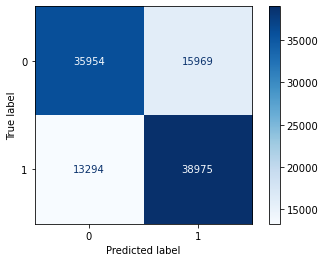

In [39]:
# Create a confusion matrix
train_models.confusion_matrix_visual(rfmodel, X_test3[cols], y_test)

### Logistic Regression with TFIDF

In [40]:
# Change the penalty to l1 instead of l2 since l1 assumes there are only a few features which are important
logreg_tfidf = train_models.log_reg(X_train_tfidf_scaled, y_train, X_test_tfidf_scaled, y_test, 
                                    solver = 'liblinear', penalty = 'l1', max_iter = 500)

Logistic Regression: Score - 0.7193578521703522 Accuracy - 0.7012726504914005 Precision - 0.7079464988198269 Recall - 0.6885917082783294


**Model seems to perform better with L1 penalty**

In [41]:
# Tried to increase C to see if it would improve accuracy since the model seems to be underfitting
C = [1, 10, 100, 1000, 10000]
for each in C:
    print('C: {}'.format(each))
    train_models.log_reg(X_train_tfidf_scaled, y_train, X_test_tfidf_scaled, y_test, 
                         C = each, max_iter = 1000, solver = 'liblinear', penalty = 'l1')
    print()

C: 1
Logistic Regression: Score - 0.7193578521703522 Accuracy - 0.7012726504914005 Precision - 0.7079464988198269 Recall - 0.6885917082783294

C: 10
Logistic Regression: Score - 0.7209638615888616 Accuracy - 0.6985085227272727 Precision - 0.7046391145649358 Recall - 0.6869655053664696

C: 100
Logistic Regression: Score - 0.7207655098280098 Accuracy - 0.6977982954545454 Precision - 0.7039530501687996 Recall - 0.6861619698100212

C: 1000
Logistic Regression: Score - 0.7207047246109746 Accuracy - 0.6977599047911548 Precision - 0.7038577763824025 Recall - 0.6862576288048365

C: 10000
Logistic Regression: Score - 0.7207495137182637 Accuracy - 0.6977599047911548 Precision - 0.7038257798705121 Recall - 0.6863341560006887



**A C value of 1 seems to work the best**

In [42]:
# Fit model with best parameters
logreg_tfidf = train_models.log_reg(X_train_tfidf_scaled, y_train, X_test_tfidf_scaled, y_test, 
                                    C = 1, max_iter = 500, solver = 'liblinear', penalty = 'l1')

Logistic Regression: Score - 0.7193578521703522 Accuracy - 0.7012726504914005 Precision - 0.7079464988198269 Recall - 0.6885917082783294


In [43]:
# Get the number of features used in the model
logreg_tfidf.coef_[np.where(logreg_tfidf.coef_ != 0)].shape

(6184,)

In [44]:
# Create ROC curve
train_models.create_roc(logreg_tfidf, X_test_tfidf_scaled, y_test)

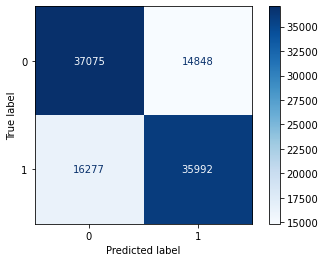

In [45]:
# Create a confusion matrix
train_models.confusion_matrix_visual(logreg_tfidf, X_test_tfidf_scaled, y_test)

**Tweaking the hyperparamter did not really help change the accuracy. This model did not perform as well as the other random forest model without TFIDF**

### Random Forest with word embeddings

In [64]:
# Look at the model with the word embeddings
# Run the feature selector
rf_features_emb = train_models.feature_importance(rf_emb, X_train2.columns)
rf_features_emb[:30]

,features,importance,importance_abs
51,advanced_word_count,0.030405,0.030405
94,avg_word_length,0.024270,0.024270
52,advanced_words_ratio,0.023362,0.023362
50,length,0.023092,0.023092
58,punctuation_ratio,0.021044,0.021044
25,25,0.016814,0.016814
19,19,0.014702,0.014702
24,24,0.014562,0.014562
30,30,0.014484,0.014484
0,0,0.014328,0.014328


In [47]:
# Determine how many features produce the best results
train_models.grid_search_features(rf_features_emb, X_train2, y_train2, X_test2, y_test2)

Top 5 features
Random Forest: Score - 0.7839501433251433 Accuracy - 0.6466619318181818 Precision - 0.6551731062735963 Recall - 0.6241749411697182

Top 10 features
Random Forest: Score - 0.9899992321867321 Accuracy - 0.714642199017199 Precision - 0.7096894248125197 Recall - 0.7296485488530486

Top 15 features
Random Forest: Score - 0.9899992321867321 Accuracy - 0.7165713298525799 Precision - 0.7138396719708084 Recall - 0.7260900342459201

Top 20 features
Random Forest: Score - 0.9899992321867321 Accuracy - 0.7176462684275184 Precision - 0.7156555551360942 Recall - 0.725363025885324

Top 25 features
Random Forest: Score - 0.9899992321867321 Accuracy - 0.7161106418918919 Precision - 0.7134765919012495 Recall - 0.7254204212822132

Top 30 features
Random Forest: Score - 0.9899992321867321 Accuracy - 0.7160050675675675 Precision - 0.713417273634088 Recall - 0.7252099714936195

Top 35 features
Random Forest: Score - 0.9899992321867321 Accuracy - 0.7162258138820639 Precision - 0.71469642519387

**Model seems to do the best with the top 20 features**

In [48]:
# Use the top 20 features and tune the model
cols = rf_features_emb[:20]['features']

# Model is overfitting so decided to increase the number of estimators 
n_estimators = [200, 500, 700, 1000]
for each in n_estimators:
    print('Number of estimators: {}'.format(each))
    rfmodel_emb = train_models.random_forest(X_train2[cols], y_train2, X_test2[cols], y_test2, n_estimators = each, n_jobs = 1)

Number of estimators: 200
Random Forest: Score - 0.9899992321867321 Accuracy - 0.7185868396805897 Precision - 0.7139155076624781 Recall - 0.7326139776923224
Number of estimators: 500
Random Forest: Score - 0.9899992321867321 Accuracy - 0.7198921222358723 Precision - 0.7142406355570405 Recall - 0.7361724922994509
Number of estimators: 700
Random Forest: Score - 0.9899992321867321 Accuracy - 0.7206119471744472 Precision - 0.7147652873861676 Recall - 0.7373012684382713
Number of estimators: 1000
Random Forest: Score - 0.9899992321867321 Accuracy - 0.7209958538083538 Precision - 0.7152400215249299 Recall - 0.7374351910310126


**Model performs the best with 1000 estimators but takes a long time to run so we decided to use 700 since the accuracy is very similar**

In [49]:
# Decrease max_depth
max_depth = [10, 25, 28, 50]
for each in max_depth:
    print('Max Depth: {}'.format(each))
    rfmodel_emb = train_models.random_forest(X_train2[cols], y_train2, X_test2[cols], y_test2, n_estimators = 700, max_depth = each, n_jobs = 1)

Max Depth: 10
Random Forest: Score - 0.6845887080262081 Accuracy - 0.6737273495085995 Precision - 0.6628524578476456 Recall - 0.7115116034360711
Max Depth: 25
Random Forest: Score - 0.981636466011466 Accuracy - 0.7227906173218673 Precision - 0.71411045191533 Recall - 0.7461210277602403
Max Depth: 28
Random Forest: Score - 0.9890810554873055 Accuracy - 0.7223587223587223 Precision - 0.7151521855354608 Recall - 0.7421607453748876
Max Depth: 50
Random Forest: Score - 0.9899992321867321 Accuracy - 0.7203720055282555 Precision - 0.7146568682032439 Recall - 0.7367655780673057


**Max depth of 25 produces the best results**

In [50]:
# Get the best model
rfmodel_emb = train_models.random_forest(X_train2[cols], y_train2, X_test2[cols], y_test2, n_estimators = 700, max_depth = 25, n_jobs = 1)

Random Forest: Score - 0.981636466011466 Accuracy - 0.7227906173218673 Precision - 0.71411045191533 Recall - 0.7461210277602403


In [51]:
# Create ROC curve
train_models.create_roc(rfmodel_emb, X_test2[cols], y_test2)

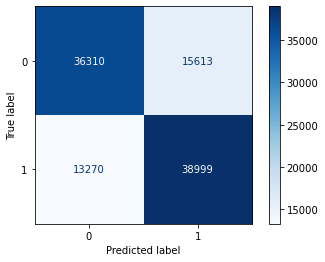

In [52]:
# Create a confusion matrix
train_models.confusion_matrix_visual(rfmodel_emb, X_test2[cols], y_test2)

**This was the best performing model**